In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
module_path = os.path.abspath(os.path.join('../../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [3]:
from machines.predictions.svr_prediction import SVR_Prediction
from machines.enums import SvrKernelEnum
from preprocesses.preprocess import Preprocess
from preprocesses.enums import TransformEnum, TypeFileEnum, StandardScaleEnum
from metrics.error_metric import ErrorMetric
from metrics.enums import MetricEnum, PlotLegends

Read the file and prepare data for SVR

In [4]:
file_csv = '../../../../data/phenotypic_weather_obregon_151617.csv'
svr = SVR_Prediction(kernel=SvrKernelEnum.LINEAR)
preprocessing =  Preprocess(file_name=file_csv, type_file=TypeFileEnum.CSV)
preprocessing.read_file(
    transform=TransformEnum.PASS,
    standard_scale=StandardScaleEnum.BASIC,
)
preprocessing.build_train_and_test()

Launched SVR

In [6]:
x_train, y_train = preprocessing.get_train()
svr.training(x_train=x_train, y_train=y_train)

In [7]:
x_test, y_test = preprocessing.get_test()
y_predicted = svr.prediction(x_test=x_test)

Get metrics

In [20]:
metric = ErrorMetric(y_predicted=y_predicted, y_test=y_test, x_test=x_test)
metric.calculate_metric_prediction()
print('Root mean squared error -> {}'.format(metric.get_metric(metric=MetricEnum.ROOT_MEAN_SQUARED_ERROR)))
print('R2 -> {}'.format(metric.get_metric(metric=MetricEnum.R2_SCORE)))
print('MAPE -> {}'.format(metric.get_metric(metric=MetricEnum.MEAN_ABSOLUTE_PERCENTAGE_ERROR)))
metric.get_all_from_predict()

Root mean squared error -> 40.66863133041336
R2 -> 0.8282866714637906
MAPE -> 0.041663389450956156


{'d2_absolute_error_score': 0.6404251183611913,
 'd2_pinball_score': 0.6404251183611913,
 'd2_tweedie_score': 0.8282866714637906,
 'explained_variance_score': 0.8285782855099364,
 'max_error': 209.25081192436778,
 'mean_absolute_error': 25.09023849015599,
 'mean_absolute_percentage_error': 0.041663389450956156,
 'mean_gamma_deviance': 0.0046365169460769245,
 'mean_poisson_deviance': 2.667962238781648,
 'mean_squared_error': 1653.9375742890793,
 'mean_squared_log_error': 0.004681926821370778,
 'median_absolute_error': 10.42700446987385,
 'r2_score': 0.8282866714637906,
 'root_mean_squared_error': 40.66863133041336,
 'root_mean_squared_log_error': 0.06842460684118527}

Plots:

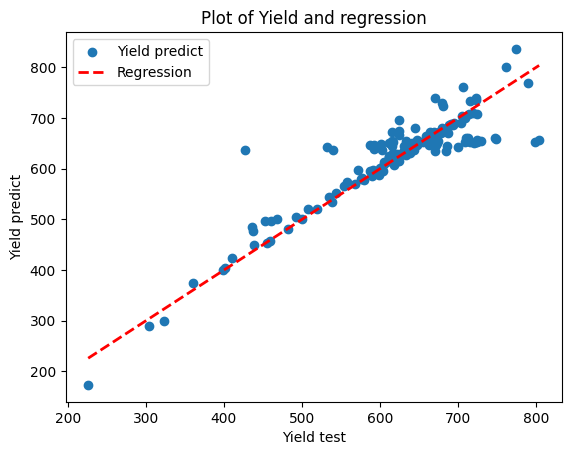

In [21]:
legend = PlotLegends()
legend.first_plot_label = "Yield predict"
legend.second_plot_label = "Regression"
legend.title = "Plot of Yield and regression"
legend.x_label = "Yield test"
legend.y_label = "Yield predict"
metric.plot_true_vs_predicted(legend=legend)


Plot $r^2$

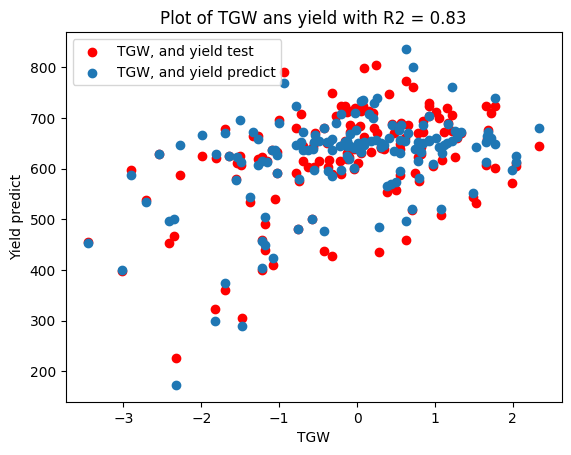

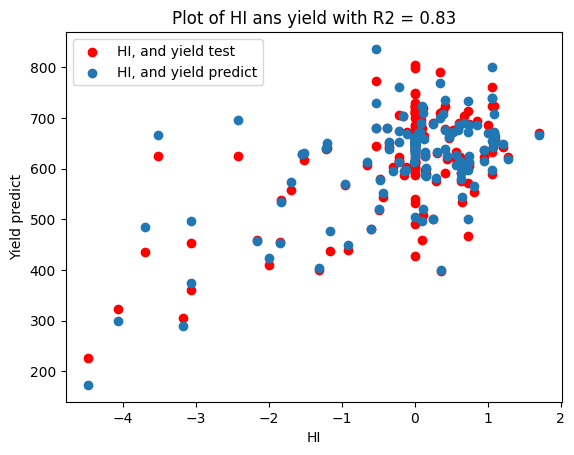

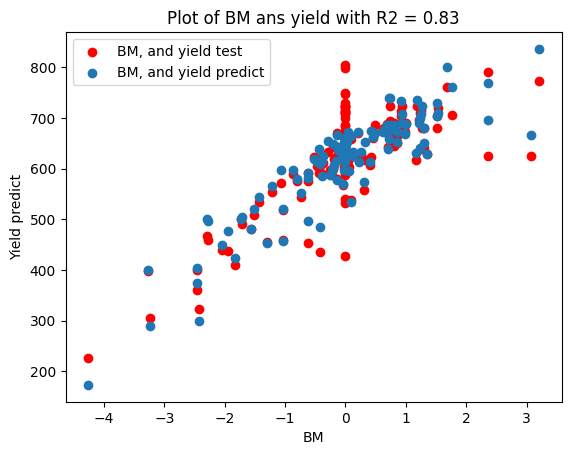

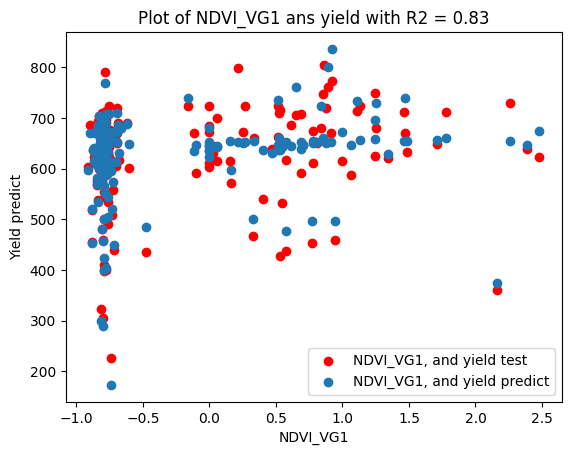

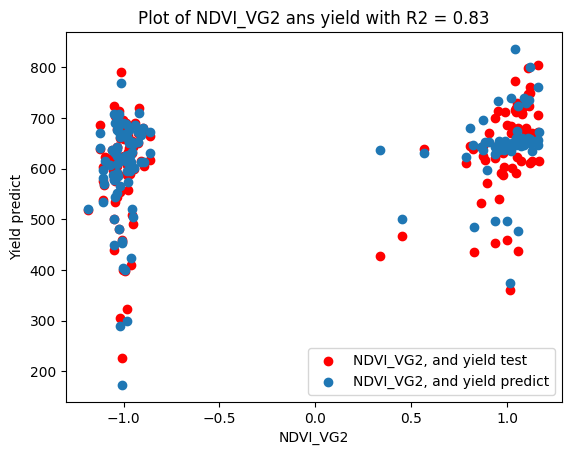

...

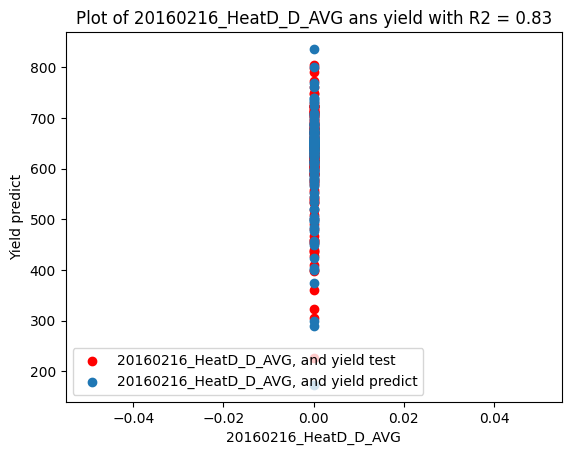

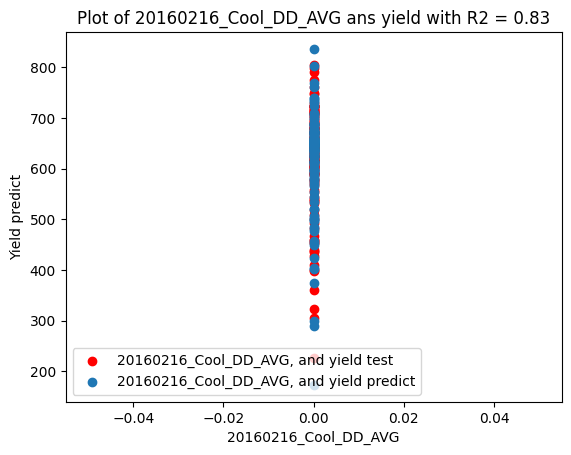

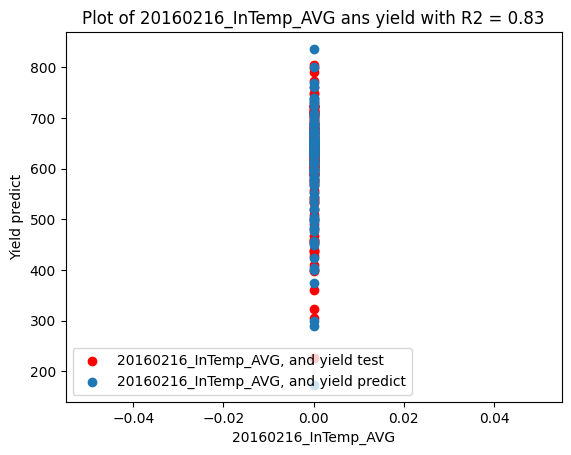

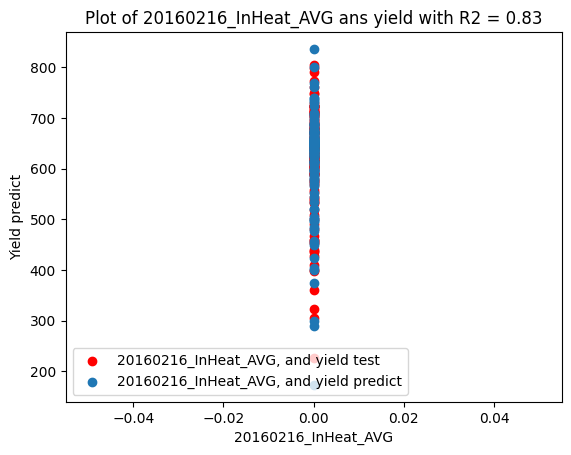

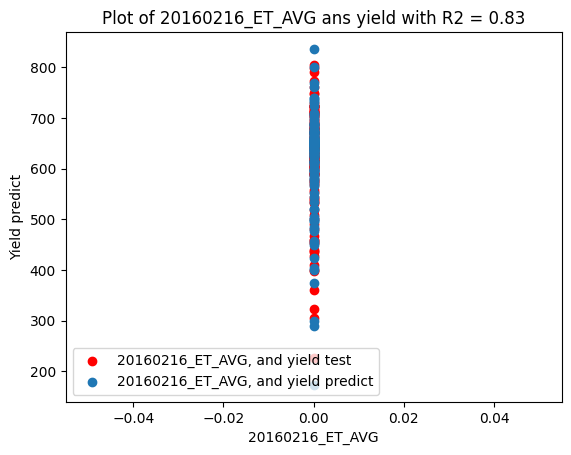

In [22]:
legend = PlotLegends()
legend.first_plot_label = "{variable}, and yield test"
legend.second_plot_label = "{variable}, and yield predict"
legend.title = "Plot of {variable} ans yield with R2 = {r2:.2f}"
legend.x_label = "{variable}"
legend.y_label = "Yield predict"
features = preprocessing.get_name_features()
metric.plot_r2_predicted(legend=legend, features=features)

Get the predict that are more bigger that .05

In [23]:
metric.list_percentage_error_upper(pivot=.04, sort = 'error')

[{'truth': 427.0, 'predict': 636.2508119243678, 'error': 0.49004873986971376},
 {'truth': 226.1118,
  'predict': 173.376235891874,
  'error': 0.23322782848186605},
 {'truth': 532.0, 'predict': 643.3480682786685, 'error': 0.2093008802230611},
 {'truth': 799.0, 'predict': 652.787647094449, 'error': 0.182994183861766},
 {'truth': 804.0, 'predict': 657.0004341430673, 'error': 0.18283528091658294},
 {'truth': 540.0, 'predict': 637.2600484277705, 'error': 0.18011120079216753},
 {'truth': 749.0, 'predict': 658.1316435669023, 'error': 0.12131956800146554},
 {'truth': 748.0, 'predict': 659.9475471415758, 'error': 0.11771718296580776},
 {'truth': 625.0, 'predict': 697.125746843092, 'error': 0.11540119494894716},
 {'truth': 436.0, 'predict': 484.182931200832, 'error': 0.11051131009365138},
 {'truth': 670.0, 'predict': 739.6339481367334, 'error': 0.10393126587572142},
 {'truth': 729.0, 'predict': 654.146632116637, 'error': 0.10267951698678057},
 {'truth': 587.0, 'predict': 647.1964269030618, 'erro